In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from pathlib import Path
from edbn.Utils.LogFile import LogFile
from edbn.Methods.SDL.sdl import transform_data
from Data.data import Data
from edbn.Predictions.setting import Setting

c:\Users\Silas\miniconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
DATAPATH=Path("Data")/"IOR10k_direct_ProM.csv"
logFile=LogFile(DATAPATH,delim=',',header=0,rows=None,time_attr='completeTime',trace_attr='case',activity_attr='event',convert=False)
logFile.keep_attributes(['case','event','startTime','completeTime'])

In [3]:
def infer_end_flag_from_data(df:pd.DataFrame)->list:
    """
    Infer the end flag from the data, i.e. the last event of each case.
    Parameters
    ----------
    df: pd.DataFrame
        The data frame of the event log.
    
    Returns
    -------
    end_flag: list
    """
    return df.groupby('case').last()['event'].unique().tolist()

def get_end_event_context_data(logfile:LogFile,END_FLAG):
    END_FLAG_INT=list(map(lambda event:logfile.convert_string2int('event',event),END_FLAG))
    return logfile.contextdata[logfile.contextdata['event'].isin(END_FLAG_INT)]

In [4]:
END_FLAG=infer_end_flag_from_data(logFile.get_data())

In [5]:
# only train split
d=Data('test',logFile)
d.prepare(setting=Setting(5,"train-test", True, False, 100, 5))

PREPARE
CONVERT
PREPROCESSING: Converting case
PREPROCESSING: Converting event
PREPROCESSING: Converting startTime
K-CONTEXT
Create k-context: 5
SPLIT TRAIN-TEST
Train: 104742
Test: 0


In [6]:
d.train

In [7]:
end_event_context_data=get_end_event_context_data(d.logfile,END_FLAG=END_FLAG)

# create label for each event

In [8]:
original_log=LogFile(DATAPATH,delim=',',header=0,rows=None,time_attr='completeTime',trace_attr='case',activity_attr='event',convert=False)
original_log.keep_attributes(['case','event','startTime','completeTime'])
# label_dict= { k:np.random.randint(0,2) for k in original_log.data['case'].unique() }

In [11]:
# count total time of each case, the total time is the difference between the completeTime of the last event and the startTime of the first event

for case,group in original_log.get_cases():
    print(case)
    print(group)

b1_0
      case                                       event  \
6284  b1_0                  Loan  application received   
6285  b1_0       Check  application  form completeness   
6286  b1_0                        Check credit history   
6287  b1_0                            Assess loan risk   
6288  b1_0                           Appraise property   
6289  b1_0                          Assess eligibility   
6290  b1_0                     Prepare acceptance pack   
6291  b1_0  Check if home insurance quote is requested   
6292  b1_0                   Send home insurance quote   
6293  b1_0                  Verify repayment agreement   
6294  b1_0                         Approve application   
6295  b1_0                  Loan  application approved   

                    startTime             completeTime  
6284  2004/02/02 10:00:00.000  2004/02/02 10:00:00.000  
6285  2004/02/02 10:11:40.741  2004/02/02 10:11:40.741  
6286  2004/02/02 11:10:14.953  2004/02/02 11:10:14.953  
6287  2004/0

In [16]:
def calculate_finish_time(group):
    group['completeTime']=pd.to_datetime(group['completeTime'])
    group['startTime']=pd.to_datetime(group['startTime'])
    return group['completeTime'].iloc[-1]-group['startTime'].iloc[0]

In [18]:
finish_time=original_log.data.groupby('case').apply(calculate_finish_time)

<AxesSubplot:ylabel='Frequency'>

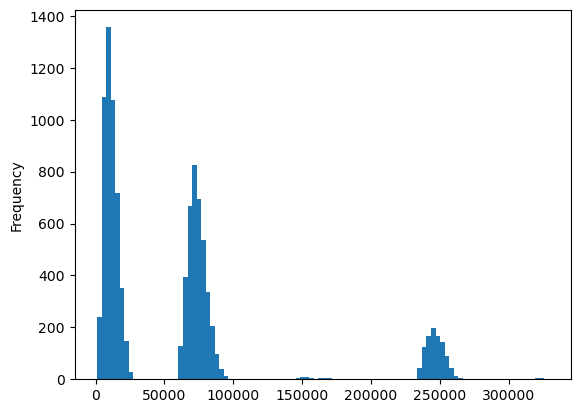

In [46]:
(finish_time/pd.Timedelta(1, unit='s')).plot.hist(bins=100)

In [52]:
ontime_threshold=(finish_time/pd.Timedelta(1, unit='s')).describe()['75%']
display(ontime_threshold)

75429.48525

In [54]:
class IsDelay():
    def __init__(self,threshold) -> None:
        self.threshold = threshold
    def __call__(self,time_usage):
        return time_usage > self.threshold

In [56]:
isDelay=IsDelay(ontime_threshold)

In [68]:
label_dict=(finish_time/pd.Timedelta(1, unit='s')).apply(isDelay).astype(int).to_dict()

In [69]:
y=end_event_context_data['case'].apply(
    lambda x:label_dict[d.logfile.convert_int2string('case',x)]
)

# create data x and y

In [71]:
import tensorflow as tf

In [72]:
def valid_attr(attr):
    return ('index' not in attr) and ('Time' not in attr) and ('case' not in attr)

In [73]:
columns_attr=list(filter(lambda x:valid_attr(x) ,d.logfile.contextdata.columns))[:-2] # ignore the current case and event
display(columns_attr)

['event_Prev4', 'event_Prev3', 'event_Prev2', 'event_Prev1']

In [74]:
y

26        0
38        0
42        0
56        0
92        0
         ..
104725    0
104731    0
104734    0
104739    0
104740    1
Name: case, Length: 10000, dtype: int64

In [75]:
x=np.array(end_event_context_data[columns_attr].to_records(index=False).tolist())

In [76]:
# tf.data.Dataset.from_tensor_slices([np.array(end_event_context_data[columns_attr].to_records(index=False).tolist()).T,np.array(y.tolist()).reshape(-1,1)])

# create a tensorflow model

Binary classification

In [77]:
model=tf.keras.models.Sequential(
    [tf.keras.layers.Dense(x.shape[1],activation='relu'),
    tf.keras.layers.Dense(20,activation='relu'),
    tf.keras.layers.Dense(20,activation='relu'),
    tf.keras.layers.Dense(1)]
)

In [78]:
for attr in columns_attr:
    print(attr)
    print(len(np.unique(end_event_context_data[attr])))
    print(np.unique(end_event_context_data[attr]))

event_Prev4
4
[ 2  5  8 14]
event_Prev3
4
[2 5 8 9]
event_Prev2
5
[ 2  4  5 18 19]
event_Prev1
4
[ 1  4 16 20]


# create a model with multiple embedding layers

In [79]:
columns_attr

['event_Prev4', 'event_Prev3', 'event_Prev2', 'event_Prev1']

In [80]:
def create_outcome_prediction_model(columns_attr):
    # create embedding layer
    input_layers=[]
    embedding_layers=[]

    for attr in columns_attr:
        input_layer=tf.keras.layers.Input(shape=(1,),name=attr)
        input_layers.append(input_layer)
        vocab_size=max(np.unique(end_event_context_data[attr]))+5 # not sure, why +5 is required here. 
        embedding_dim=vocab_size+5
        embedding_layers.append( tf.keras.layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim, embeddings_initializer="zeros")(input_layer))
    concat_layer=tf.keras.layers.Concatenate()(embedding_layers)
    flat=tf.keras.layers.Flatten()(concat_layer)
    drop=tf.keras.layers.Dropout(0.2)(flat)
    dense=tf.keras.layers.Dense(20)(drop) 
    dense2=tf.keras.layers.Dense(1)(dense)
    return tf.keras.Model(inputs=input_layers,outputs=[dense2])

In [83]:
model=create_outcome_prediction_model(columns_attr)

In [84]:
def convert2networkInput(x):
    return list(map(lambda x: np.array(x),x.T.tolist()))

In [86]:
loss_fn=tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [87]:
model.compile(optimizer='adam',loss=loss_fn,metrics=['accuracy'])

In [88]:
y=(x[:,0]<10).astype(float)

In [89]:
model.fit(convert2networkInput(x),y,epochs=10,batch_size=128)

Epoch 1/10
79/79 [==============================] - 2s 2ms/step - loss: 0.2779 - accuracy: 0.8616
Epoch 2/10
79/79 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 3/10
79/79 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 4/10
79/79 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
Epoch 5/10
79/79 [==============================] - 0s 2ms/step - loss: 7.1806e-04 - accuracy: 1.0000
Epoch 6/10
79/79 [==============================] - 0s 2ms/step - loss: 4.8711e-04 - accuracy: 1.0000
Epoch 7/10
79/79 [==============================] - 0s 2ms/step - loss: 3.5488e-04 - accuracy: 1.0000
Epoch 8/10
79/79 [==============================] - 0s 2ms/step - loss: 2.6645e-04 - accuracy: 1.0000
Epoch 9/10
79/79 [==============================] - 0s 2ms/step - loss: 2.0886e-04 - accuracy: 1.0000
Epoch 10/10
79/79 [==============================] - 0s 3ms/step - loss: 1.6759e-04 - accuracy: 1.

In [90]:
model.evaluate(convert2networkInput(x),y,verbose=2)

313/313 - 1s - loss: 1.3640e-04 - accuracy: 1.0000 - 622ms/epoch - 2ms/step


[0.00013640210090670735, 1.0]